In [47]:
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset (update the path to your file)
data = pd.read_csv('12bb84ed-397e-435c-8d1b-8ce543108698.csv')

# View the first few rows of the dataset
data.head()

,_id,route,ridership_route_code,route_full_name,current_garage,mode,month_start,year_month,day_type,avg_riders,day_count
0,1,1,001,1 - FREEPORT ROAD,Ross,Bus,2017-01-01,201701,SAT.,969.50,4
1,2,4,004,4 - TROY HILL,Ross,Bus,2017-01-01,201701,SAT.,218.25,4
2,3,6,006,6 - SPRING HILL,Ross,Bus,2017-01-01,201701,SAT.,495.50,4
3,4,8,008,8 - PERRYSVILLE,Ross,Bus,2017-01-01,201701,SAT.,1480.00,4
4,5,11,011,11 - FINEVIEW,Ross,Bus,2017-01-01,201701,SAT.,208.00,4


In [4]:
# Summary statistics for average riders
print(data['avg_riders'].describe())

# Total riders per transit mode
mode_summary = data.groupby('mode')['avg_riders'].sum().reset_index()
print(mode_summary)

count    21835.000000
mean      1190.235584
std       1398.476463
min         -1.954545
25%        340.845238
50%        727.409091
75%       1486.125000
max      11510.250000
Name: avg_riders, dtype: float64
         mode    avg_riders
0         Bus  2.232947e+07
1     Incline  3.244668e+05
2  Light Rail  8.115560e+05
3        Rail  2.523068e+06


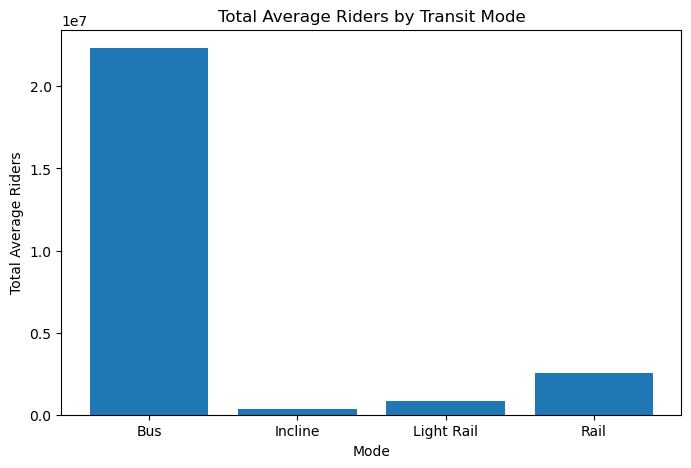

In [5]:
import matplotlib.pyplot as plt

# Bar plot of average riders by mode
plt.figure(figsize=(8, 5))
plt.bar(mode_summary['mode'], mode_summary['avg_riders'])
plt.title('Total Average Riders by Transit Mode')
plt.xlabel('Mode')
plt.ylabel('Total Average Riders')
plt.show()

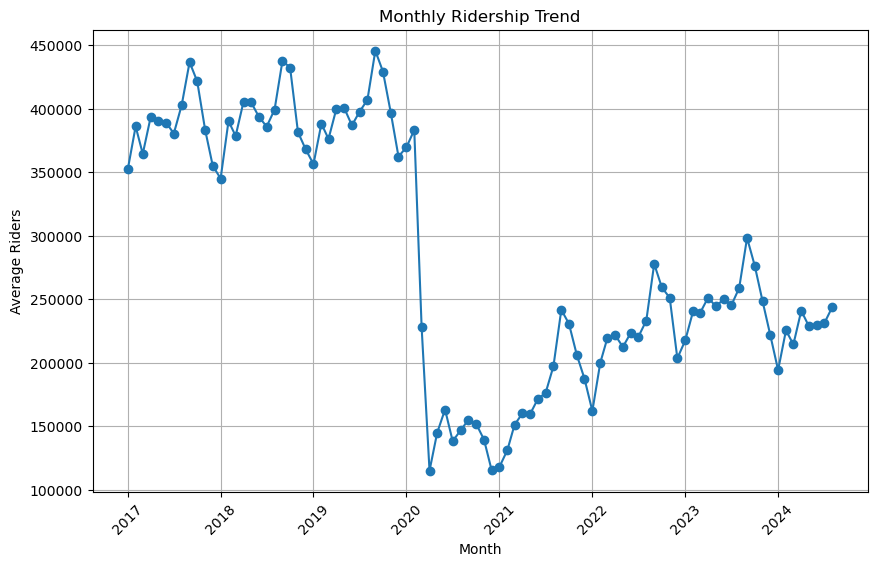

In [6]:
# Convert 'month_start' to datetime for plotting
data['month_start'] = pd.to_datetime(data['month_start'])

# Group data by month to get total average riders
monthly_ridership = data.groupby('month_start')['avg_riders'].sum().reset_index()

# Line plot of ridership over time
plt.figure(figsize=(10, 6))
plt.plot(monthly_ridership['month_start'], monthly_ridership['avg_riders'], marker='o')
plt.title('Monthly Ridership Trend')
plt.xlabel('Month')
plt.ylabel('Average Riders')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

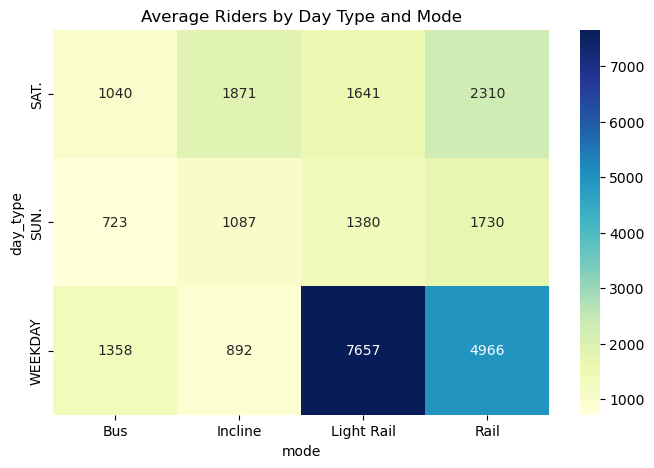

In [7]:
import seaborn as sns

# Pivot table for heatmap
pivot = data.pivot_table(values='avg_riders', index='day_type', columns='mode', aggfunc='mean')

# Heatmap
plt.figure(figsize=(8, 5))
sns.heatmap(pivot, annot=True, cmap='YlGnBu', fmt=".0f")
plt.title('Average Riders by Day Type and Mode')
plt.show()

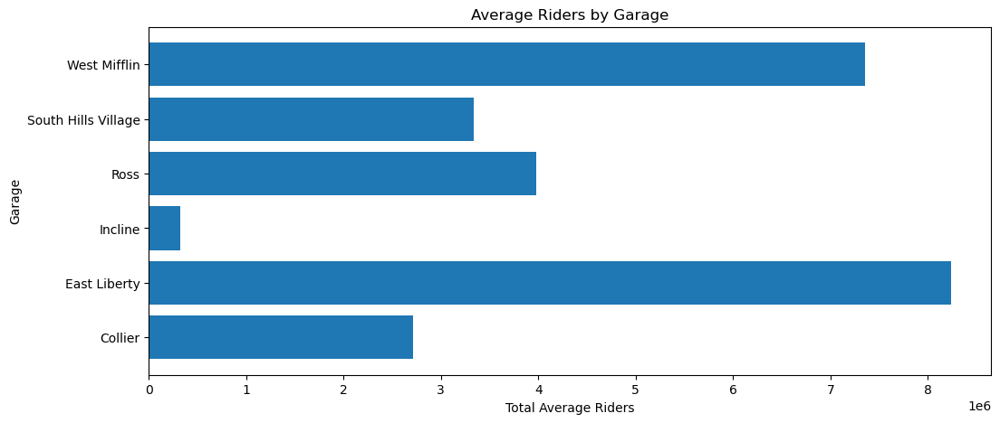

In [8]:
# Group by garage and sum the riders
garage_ridership = data.groupby('current_garage')['avg_riders'].sum().reset_index()

# Bar plot of riders by garage
plt.figure(figsize=(12, 5))
plt.barh(garage_ridership['current_garage'], garage_ridership['avg_riders'])
plt.title('Average Riders by Garage')
plt.xlabel('Total Average Riders')
plt.ylabel('Garage')
plt.show()

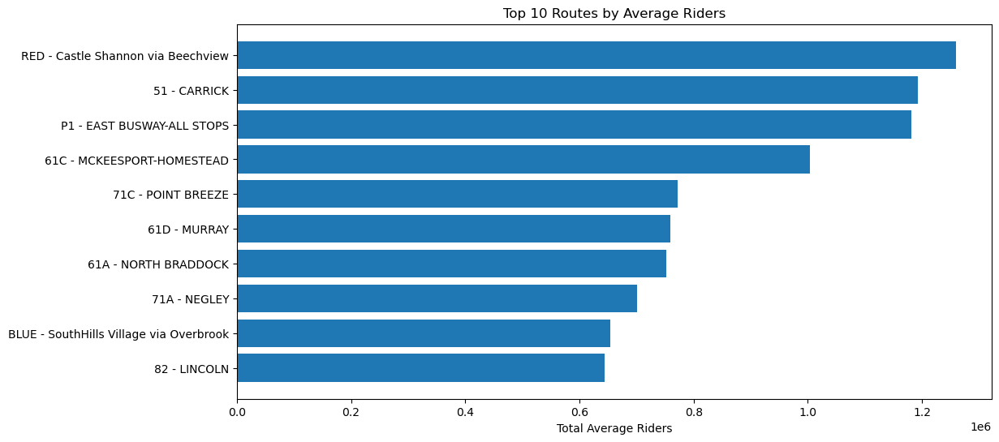

In [9]:
# Group by route and get the total riders
route_ridership = data.groupby('route_full_name')['avg_riders'].sum().reset_index()

# Sort by total riders and plot top 10 routes
top_routes = route_ridership.sort_values(by='avg_riders', ascending=False).head(10)

# Bar plot for top 10 routes
plt.figure(figsize=(12, 6))
plt.barh(top_routes['route_full_name'], top_routes['avg_riders'])
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.title('Top 10 Routes by Average Riders')
plt.xlabel('Total Average Riders')
plt.show()

In [10]:
# Group by day_type and calculate the mean and variance
day_type_stats = data.groupby('day_type')['avg_riders'].agg(['mean', 'var']).reset_index()

print(day_type_stats)

  day_type         mean           var
0     SAT.  1111.596278  1.158360e+06
1     SUN.   781.472828  5.861667e+05
2  WEEKDAY  1516.724740  3.201150e+06


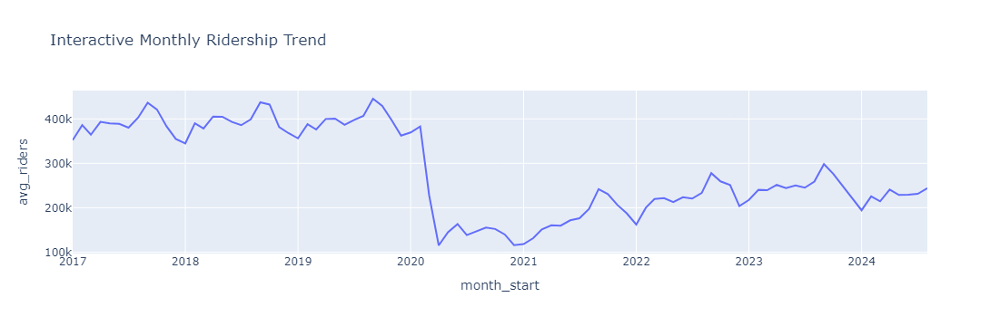

In [11]:
import plotly.express as px

# Interactive line plot with Plotly
fig = px.line(monthly_ridership, x='month_start', y='avg_riders', 
              title='Interactive Monthly Ridership Trend')
fig.show()

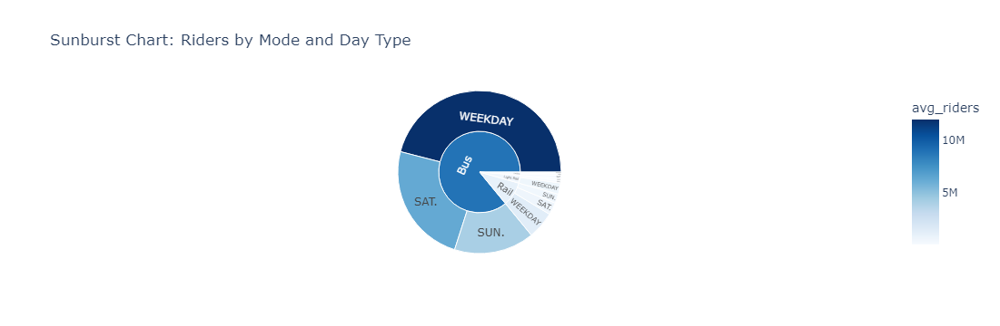

In [21]:
import plotly.express as px

# Prepare data for Sunburst (group by mode, day_type, and sum avg_riders)
sunburst_data = data.groupby(['mode', 'day_type']).agg({'avg_riders': 'sum'}).reset_index()

# Create Sunburst chart
fig = px.sunburst(
    sunburst_data, 
    path=['mode', 'day_type'], 
    values='avg_riders',
    title='Sunburst Chart: Riders by Mode and Day Type',
    color='avg_riders',
    color_continuous_scale='Blues'
)
fig.show()


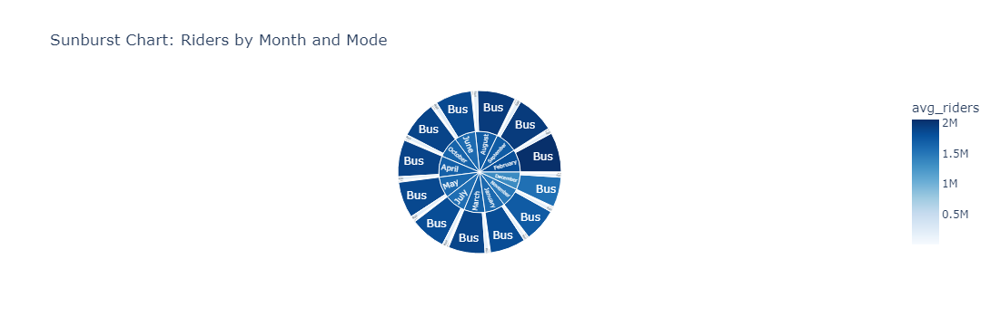

In [23]:
# Extracting month names and preparing the data for a sunburst plot
data['month'] = data['month_start'].dt.strftime('%B')  # Get month names
sunburst_data = data.groupby(['month', 'mode']).agg({'avg_riders': 'sum'}).reset_index()

# Creating the sunburst chart
fig = px.sunburst(
    sunburst_data,
    path=['month', 'mode'],
    values='avg_riders',
    title='Sunburst Chart: Riders by Month and Mode',
    color='avg_riders',
    color_continuous_scale='Blues'
)

fig.show()

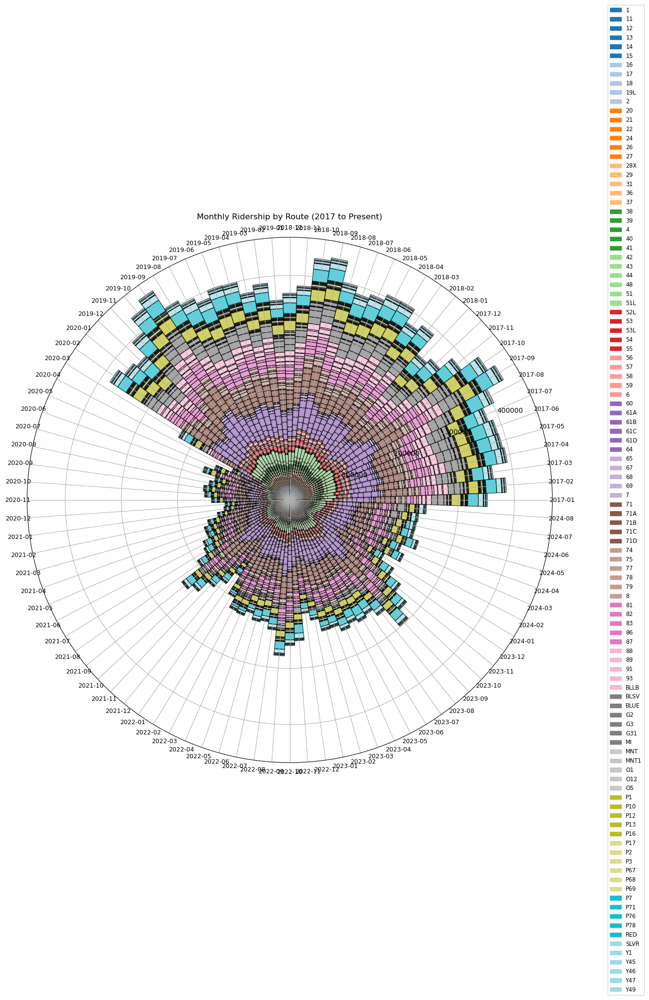

In [29]:
# Convert the 'month_start' column to datetime for filtering and grouping
data['month_start'] = pd.to_datetime(data['month_start'])

# Filter the data from January 2017 onwards
filtered_data = data[data['month_start'] >= '2017-01-01']

# Group the data by year-month and route, summing the average riders
monthly_ridership = filtered_data.groupby(
    [filtered_data['month_start'].dt.to_period('M'), 'route']
)['avg_riders'].sum().reset_index()

# Create a unique month-year identifier for easier plotting
monthly_ridership['month_year'] = monthly_ridership['month_start'].astype(str)

# Pivot the data to create a matrix where each row is a month and each column is a route
pivot_data = monthly_ridership.pivot_table(
    index='month_year', columns='route', values='avg_riders', fill_value=0
)

# Generate the circular bar plot
fig, ax = plt.subplots(figsize=(14, 14), subplot_kw={'projection': 'polar'})

# Define angles and bar width
num_months = len(pivot_data)
angles = np.linspace(0, 2 * np.pi, num_months, endpoint=False).tolist()
width = 2 * np.pi / num_months

# Generate color map for routes
colors = plt.cm.tab20(np.linspace(0, 1, pivot_data.shape[1]))

# Plot each month as a stacked bar in polar coordinates
for idx, (month, row) in enumerate(pivot_data.iterrows()):
    bottom = 0
    for i, value in enumerate(row):
        ax.bar(
            angles[idx], value, width=width, bottom=bottom, color=colors[i], edgecolor='black', alpha=0.7
        )
        bottom += value

# Add labels for each month-year
ax.set_xticks(angles)
ax.set_xticklabels(pivot_data.index, fontsize=9, ha='center', rotation=45)

# Add a title
plt.title('Monthly Ridership by Route (2017 to Present)', va='bottom')

# Display legend for route colors
ax.legend(
    [plt.Rectangle((0, 0), 1, 1, color=c) for c in colors],
    pivot_data.columns,
    loc='center left', bbox_to_anchor=(1.1, 0.5), fontsize='small'
)

# Show the plot
plt.show()


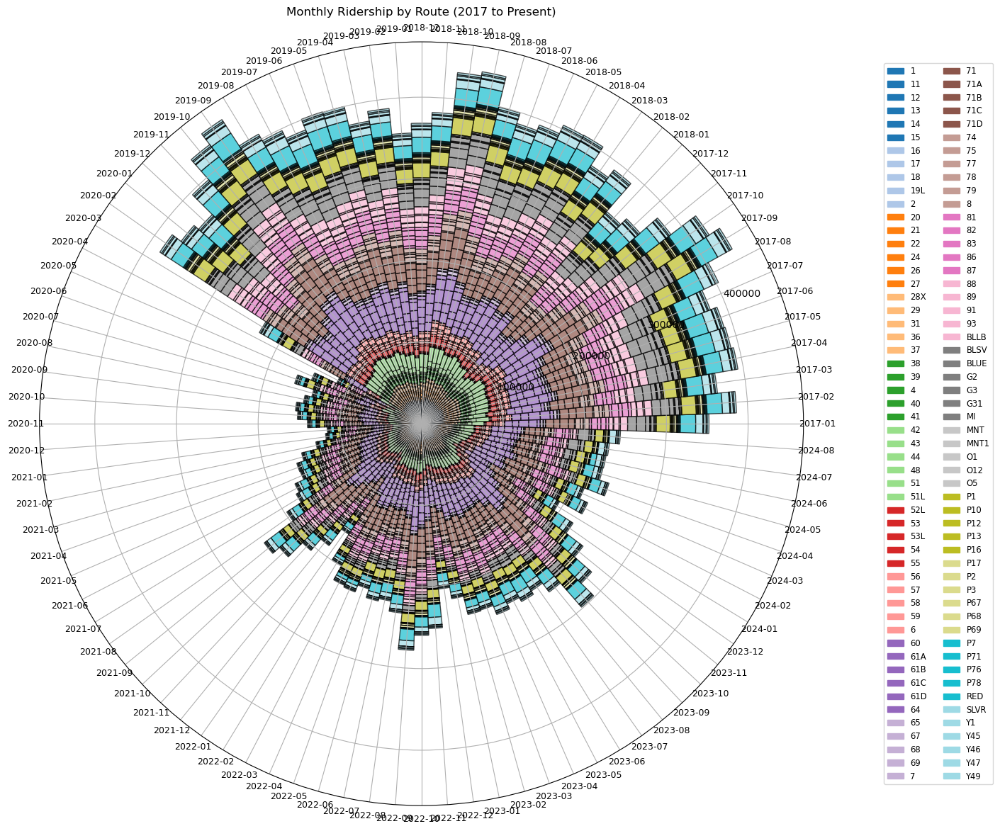

In [31]:
# Convert the 'month_start' column to datetime for filtering and grouping
data['month_start'] = pd.to_datetime(data['month_start'])

# Filter the data from January 2017 onwards
filtered_data = data[data['month_start'] >= '2017-01-01']

# Group the data by year-month and route, summing the average riders
monthly_ridership = filtered_data.groupby(
    [filtered_data['month_start'].dt.to_period('M'), 'route']
)['avg_riders'].sum().reset_index()

# Create a unique month-year identifier for easier plotting
monthly_ridership['month_year'] = monthly_ridership['month_start'].astype(str)

# Pivot the data to create a matrix where each row is a month and each column is a route
pivot_data = monthly_ridership.pivot_table(
    index='month_year', columns='route', values='avg_riders', fill_value=0
)

# Generate the circular bar plot
fig, ax = plt.subplots(figsize=(14, 14), subplot_kw={'projection': 'polar'})

# Define angles and bar width
num_months = len(pivot_data)
angles = np.linspace(0, 2 * np.pi, num_months, endpoint=False).tolist()
width = 2 * np.pi / num_months

# Generate color map for routes
colors = plt.cm.tab20(np.linspace(0, 1, pivot_data.shape[1]))

# Plot each month as a stacked bar in polar coordinates
for idx, (month, row) in enumerate(pivot_data.iterrows()):
    bottom = 0
    for i, value in enumerate(row):
        ax.bar(
            angles[idx], value, width=width, bottom=bottom, color=colors[i], edgecolor='black', alpha=0.7
        )
        bottom += value

# Add labels for each month-year
ax.set_xticks(angles)
ax.set_xticklabels(pivot_data.index, fontsize=9, ha='center', rotation=45)

# Add a title
plt.title('Monthly Ridership by Route (2017 to Present)', va='bottom')

# Display a two-column legend for route colors
ax.legend(
    [plt.Rectangle((0, 0), 1, 1, color=c) for c in colors],
    pivot_data.columns,
    loc='center left', bbox_to_anchor=(1.1, 0.5), fontsize='small', ncol=2
)

# Show the plot
plt.show()

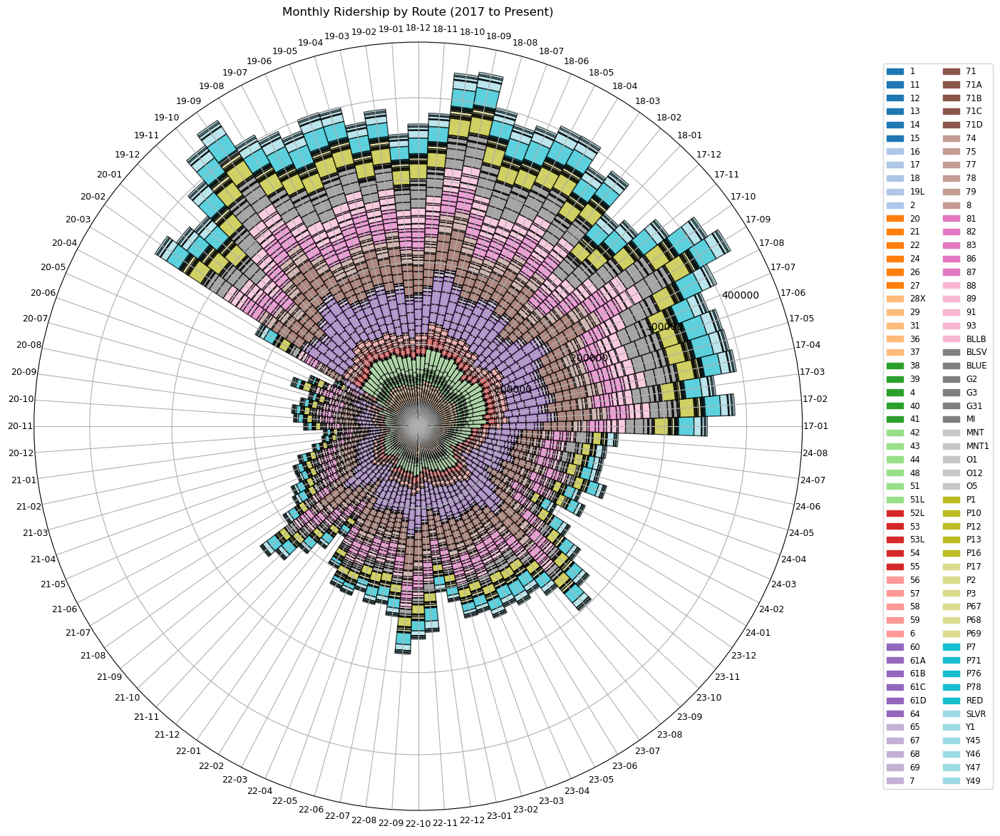

In [33]:
# Convert the 'month_start' column to datetime for filtering and grouping
data['month_start'] = pd.to_datetime(data['month_start'])

# Filter the data from January 2017 onwards
filtered_data = data[data['month_start'] >= '2017-01-01']

# Group the data by year-month and route, summing the average riders
monthly_ridership = filtered_data.groupby(
    [filtered_data['month_start'].dt.to_period('M'), 'route']
)['avg_riders'].sum().reset_index()

# Create a unique month-year identifier with the format YY-MM
monthly_ridership['month_year'] = monthly_ridership['month_start'].dt.strftime('%y-%m')

# Pivot the data to create a matrix where each row is a month and each column is a route
pivot_data = monthly_ridership.pivot_table(
    index='month_year', columns='route', values='avg_riders', fill_value=0
)

# Generate the circular bar plot
fig, ax = plt.subplots(figsize=(14, 14), subplot_kw={'projection': 'polar'})

# Define angles and bar width
num_months = len(pivot_data)
angles = np.linspace(0, 2 * np.pi, num_months, endpoint=False).tolist()
width = 2 * np.pi / num_months

# Generate color map for routes
colors = plt.cm.tab20(np.linspace(0, 1, pivot_data.shape[1]))

# Plot each month as a stacked bar in polar coordinates
for idx, (month, row) in enumerate(pivot_data.iterrows()):
    bottom = 0
    for i, value in enumerate(row):
        ax.bar(
            angles[idx], value, width=width, bottom=bottom, color=colors[i], edgecolor='black', alpha=0.7
        )
        bottom += value

# Add labels for each month-year with radial alignment
ax.set_xticks(angles)
ax.set_xticklabels(
    pivot_data.index, fontsize=9, ha='center', va='center', rotation_mode='anchor'
)

# Rotate the labels along the radial axis
for label, angle in zip(ax.get_xticklabels(), angles):
    label.set_rotation(np.degrees(angle) + 90)  # Rotate 90 degrees for radial alignment

# Add a title
plt.title('Monthly Ridership by Route (2017 to Present)', va='bottom')

# Display a two-column legend for route colors
ax.legend(
    [plt.Rectangle((0, 0), 1, 1, color=c) for c in colors],
    pivot_data.columns,
    loc='center left', bbox_to_anchor=(1.1, 0.5), fontsize='small', ncol=2
)

# Show the plot
plt.show()


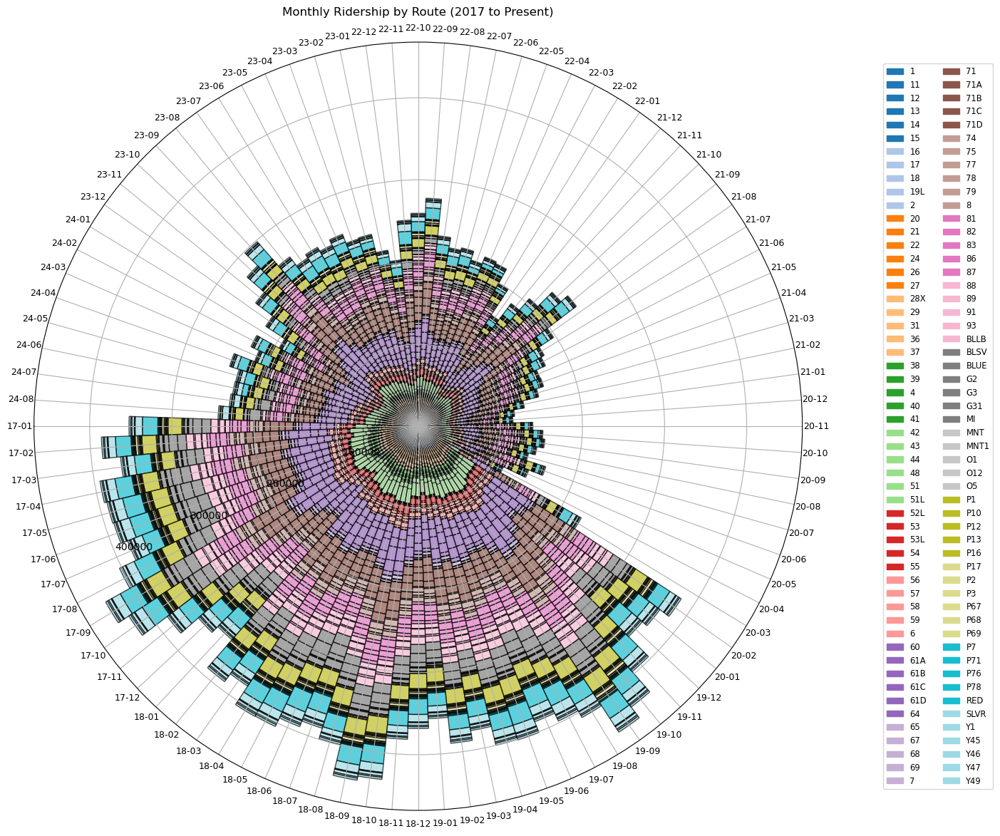

In [35]:
# Convert the 'month_start' column to datetime for filtering and grouping
data['month_start'] = pd.to_datetime(data['month_start'])

# Filter the data from January 2017 onwards
filtered_data = data[data['month_start'] >= '2017-01-01']

# Group the data by year-month and route, summing the average riders
monthly_ridership = filtered_data.groupby(
    [filtered_data['month_start'].dt.to_period('M'), 'route']
)['avg_riders'].sum().reset_index()

# Create a unique month-year identifier with the format YY-MM
monthly_ridership['month_year'] = monthly_ridership['month_start'].dt.strftime('%y-%m')

# Pivot the data to create a matrix where each row is a month and each column is a route
pivot_data = monthly_ridership.pivot_table(
    index='month_year', columns='route', values='avg_riders', fill_value=0
)

# Generate the circular bar plot
fig, ax = plt.subplots(figsize=(14, 14), subplot_kw={'projection': 'polar'})

# Define angles and bar width
num_months = len(pivot_data)
angles = np.linspace(0, 2 * np.pi, num_months, endpoint=False).tolist()
width = 2 * np.pi / num_months

# Generate color map for routes
colors = plt.cm.tab20(np.linspace(0, 1, pivot_data.shape[1]))

# Plot each month as a stacked bar in polar coordinates
for idx, (month, row) in enumerate(pivot_data.iterrows()):
    bottom = 0
    for i, value in enumerate(row):
        ax.bar(
            angles[idx], value, width=width, bottom=bottom, color=colors[i], edgecolor='black', alpha=0.7
        )
        bottom += value

# Add labels for each month-year with radial alignment
ax.set_xticks(angles)
ax.set_xticklabels(
    pivot_data.index, fontsize=9, ha='center', va='center', rotation_mode='anchor'
)

# Rotate the labels along the radial axis
for label, angle in zip(ax.get_xticklabels(), angles):
    label.set_rotation(np.degrees(angle) + 90)  # Rotate 90 degrees for radial alignment

# Move the radial ticks to align with the angle for 2020-11
theta_offset = angles[pivot_data.index.get_loc('20-11')]  # Get the angle for 2020-11

# Adjust the position of the radial ticks
ax.set_theta_offset(theta_offset)  # Rotate the plot to align the radial ticks

# Add a title
plt.title('Monthly Ridership by Route (2017 to Present)', va='bottom')

# Display a two-column legend for route colors
ax.legend(
    [plt.Rectangle((0, 0), 1, 1, color=c) for c in colors],
    pivot_data.columns,
    loc='center left', bbox_to_anchor=(1.1, 0.5), fontsize='small', ncol=2
)

# Show the plot
plt.show()


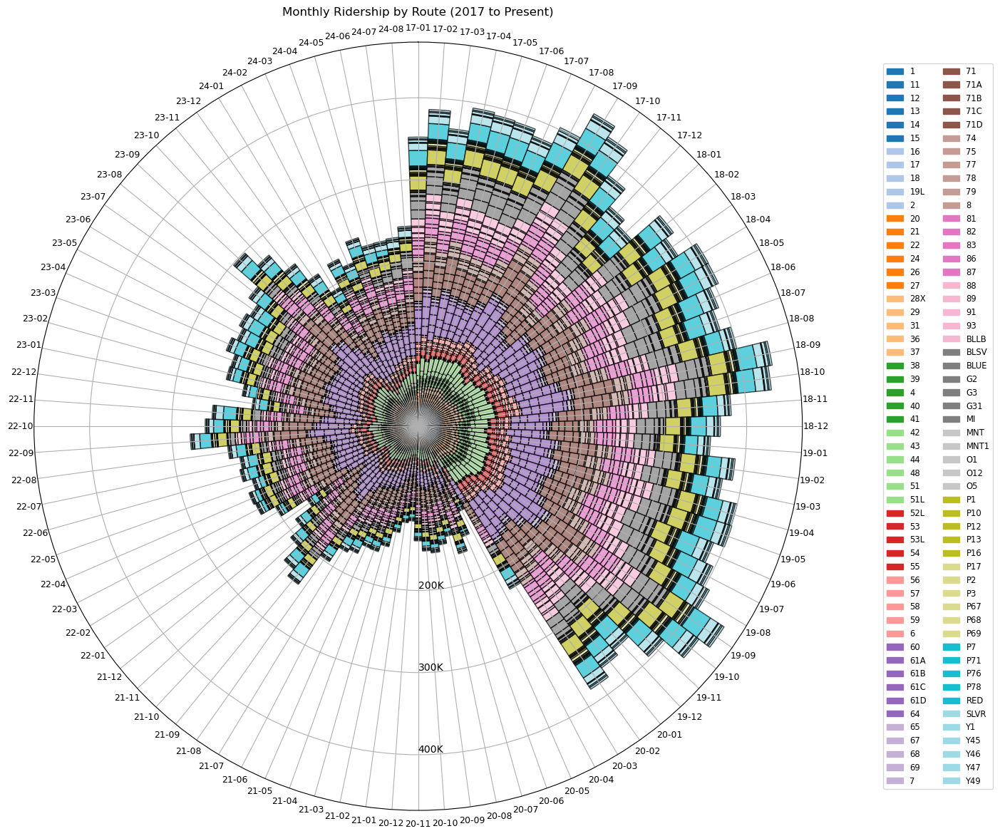

In [45]:
# Convert the 'month_start' column to datetime for filtering and grouping
data['month_start'] = pd.to_datetime(data['month_start'])

# Filter the data from January 2017 onwards
filtered_data = data[data['month_start'] >= '2017-01-01']

# Group the data by year-month and route, summing the average riders
monthly_ridership = filtered_data.groupby(
    [filtered_data['month_start'].dt.to_period('M'), 'route']
)['avg_riders'].sum().reset_index()

# Create a unique month-year identifier with the format YY-MM
monthly_ridership['month_year'] = monthly_ridership['month_start'].dt.strftime('%y-%m')

# Pivot the data to create a matrix where each row is a month and each column is a route
pivot_data = monthly_ridership.pivot_table(
    index='month_year', columns='route', values='avg_riders', fill_value=0
)

# Generate the circular bar plot
fig, ax = plt.subplots(figsize=(14, 14), subplot_kw={'projection': 'polar'})

# Define angles and bar width
num_months = len(pivot_data)
angles = np.linspace(0, 2 * np.pi, num_months, endpoint=False).tolist()
width = 2 * np.pi / num_months

# Generate color map for routes
colors = plt.cm.tab20(np.linspace(0, 1, pivot_data.shape[1]))

# Plot each month as a stacked bar in polar coordinates
for idx, (month, row) in enumerate(pivot_data.iterrows()):
    bottom = 0
    for i, value in enumerate(row):
        ax.bar(
            angles[idx], value, width=width, bottom=bottom, color=colors[i], edgecolor='black', alpha=0.7
        )
        bottom += value

# Add labels for each month-year with radial alignment
ax.set_xticks(angles)
ax.set_xticklabels(
    pivot_data.index, fontsize=9, ha='center', va='center', rotation_mode='anchor'
)

# Rotate the labels along the radial axis
for label, angle in zip(ax.get_xticklabels(), angles):
    label.set_rotation(np.degrees(angle) + 90)  # Rotate 90 degrees for radial alignment

# Set the starting location to 0 degrees (with 17-01 at the top)
ax.set_theta_zero_location('N')  # 'N' means north, i.e., 0 degrees at the top

# Set the direction to clockwise
ax.set_theta_direction(-1)  # -1 sets the direction to clockwise

# Move the radial tick labels to align with the 2020-11 radii
target_angle = angles[pivot_data.index.get_loc('20-11')]  # Angle for 2020-11
ax.set_rlabel_position(np.degrees(target_angle))  # Align radial tick labels to this angle

# Customize the radial ticks to exclude 10,000
ax.set_yticks([200000, 300000, 400000])  # Only include these tick values
ax.set_yticklabels(['200K', '300K', '400K'], fontsize=10)  # Format the labels

# Add a title
plt.title('Monthly Ridership by Route (2017 to Present)', va='bottom')

# Display a two-column legend for route colors
ax.legend(
    [plt.Rectangle((0, 0), 1, 1, color=c) for c in colors],
    pivot_data.columns,
    loc='center left', bbox_to_anchor=(1.1, 0.5), fontsize='small', ncol=2
)

# Save the plot to a file
plt.savefig('monthly_ridership_circular_plot.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()